## Setting up the google colab (optional)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install numpy
!pip install pandas
!pip install scanpy
!pip install scanpy.external
!pip install harmonypy
!pip install seaborn
!pip install mudata
!pip install muon
!pip install mudatasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 23.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.2/104.2 kB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 11.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 58.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 9.8 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82808 sha256=6a7369162b1d67cfa3ff2615a8004f5b300634eb0ab9d76f2dfb19bb9360487e
  Stored in directory: /root/.cache/pip/wheels/a0/e8/c6/a37ea663620bd5200ea1ba0907ab3c217042c1d035ef606acc
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl size=8027 sha256=0c292f3339daaed6bccaae650490b3437cc90c124697caddb4a29e8517d81304
  Stored in directory: /root/.cache/pip/wheels/6a/a

## Importing modules and settings

In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import harmonypy as hm
import sys
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import scipy as sp
import mudata as md
import muon as mu
import mudatasets as mds
import os

In [ ]:
from matplotlib.pyplot import rc_context

General settings of Scanpy

In [ ]:
sc.settings.verbosity = 4
sc.logging.print_header()
sc.settings.set_figure_params(dpi=300, facecolor='white', format = 'pdf', vector_friendly = True)

scanpy==1.9.1 anndata==0.8.0 umap==0.5.2 numpy==1.22.4 scipy==1.10.1 pandas==1.4.3 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.10.4 louvain==0.7.1 pynndescent==0.5.6


In [ ]:
umap_cmap = sns.blend_palette(['lightgrey', 'xkcd:sapphire'], as_cmap = True)

## Declaring the input and output files

In [ ]:
#Processed file
mdata = mu.read('/mnt/sda/david/hydractinia/hydractinia_atlas_20230812.h5mu')
adata= (mdata.mod['no'])

/mnt/sda/david/.local/lib/python3.8/site-packages/mudata/_core/mudata.py:457: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


In [ ]:
leiden_names = adata.obs.columns[adata.obs.columns.str.contains('leiden')].to_list()

In [ ]:
leiden_names

['leiden_1', 'leiden_1.5', 'leiden_2']

In [ ]:
adata.var

,ratio_with_no,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm,mean,std
LOC130612030,1.119558,False,10,0.000050,99.995004,10.0,True,4.273221e-03,4.748613,0.593155,0.000216,0.030688
LOC130612033,1.346984,False,125,0.000664,99.937556,133.0,True,5.228799e-02,4.743840,0.575159,0.002655,0.107926
LOC130612034,1.429284,False,201,0.001179,99.899590,236.0,True,6.864602e-02,4.772200,0.682099,0.003954,0.128323
LOC130612035,1.428458,False,520,0.002733,99.740232,547.0,True,1.784180e-01,4.663227,0.271175,0.010625,0.212273
LOC130612036,1.145483,False,12870,0.074044,93.570754,14822.0,True,1.815345e+00,4.691698,-0.360676,0.267720,1.040346
...,...,...,...,...,...,...,...,...,...,...,...,...
Trnav-cac_103,1.071283,False,0,0.000000,100.000000,0.0,True,1.000000e-12,NaN,NaN,0.000000,1.000000
Trnaw-cca_146,1.071283,False,0,0.000000,100.000000,0.0,True,1.000000e-12,NaN,NaN,0.000000,1.000000
Trnaw-cca_167,1.071283,False,1,0.000005,99.999500,1.0,True,6.355289e-04,4.840893,0.941132,0.000024,0.010866
Trnay-gua_152,1.060409,False,5,0.000025,99.997502,5.0,True,1.554264e-03,4.499506,-0.346198,0.000086,0.019270


In [ ]:
adata.obs

,Experiment,Library,Body_part,Presence_of_PEG,batch,n_counts,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden_1,leiden_1.5,leiden_2,Colony_part,Unique
CTGTAGCCAAACATCGGACTAGTA-0-0,lib_29,lib_29_1,Polyps,PEG,3,52.0,50,50,52.0,0.0,0.0,0,0,13,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG
CGAACTTACAAGACTAACAGATTC-0-0,lib_29,lib_29_1,Polyps,PEG,3,109.0,99,99,109.0,0.0,0.0,3,6,3,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG
AGAGTCAACGACACACGATAGACA-0-0,lib_29,lib_29_1,Polyps,PEG,3,124.0,107,107,124.0,0.0,0.0,2,4,4,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG
CGCTGATCACGCTCGAAAGAGATC-0-0,lib_29,lib_29_1,Polyps,PEG,3,83.0,62,62,83.0,0.0,0.0,3,8,21,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG
AAGACGGAGGAGAACACGAACTTA-0-0,lib_29,lib_29_1,Polyps,PEG,3,54.0,51,51,54.0,0.0,0.0,3,6,3,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CAATGGAAGAATCTGAATAGCGAC-3-1,lib_20,lib_20_4,Polyps,PEG,1,74.0,70,70,74.0,0.0,0.0,0,0,0,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG
AAGGTACACACCTTACCAGCGTTA-3-1,lib_20,lib_20_4,Polyps,PEG,1,58.0,52,52,58.0,0.0,0.0,6,15,19,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG
GAATCTGAACAAGCTATGAAGAGA-3-1,lib_20,lib_20_4,Polyps,PEG,1,287.0,220,220,287.0,0.0,0.0,18,21,24,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG
CTGGCATATGGCTTCACATACCAA-3-1,lib_20,lib_20_4,Polyps,PEG,1,326.0,255,255,326.0,0.0,0.0,12,11,11,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG


## Plots res 1.5

In [ ]:
clusteringlayer = 'leiden_1.5'

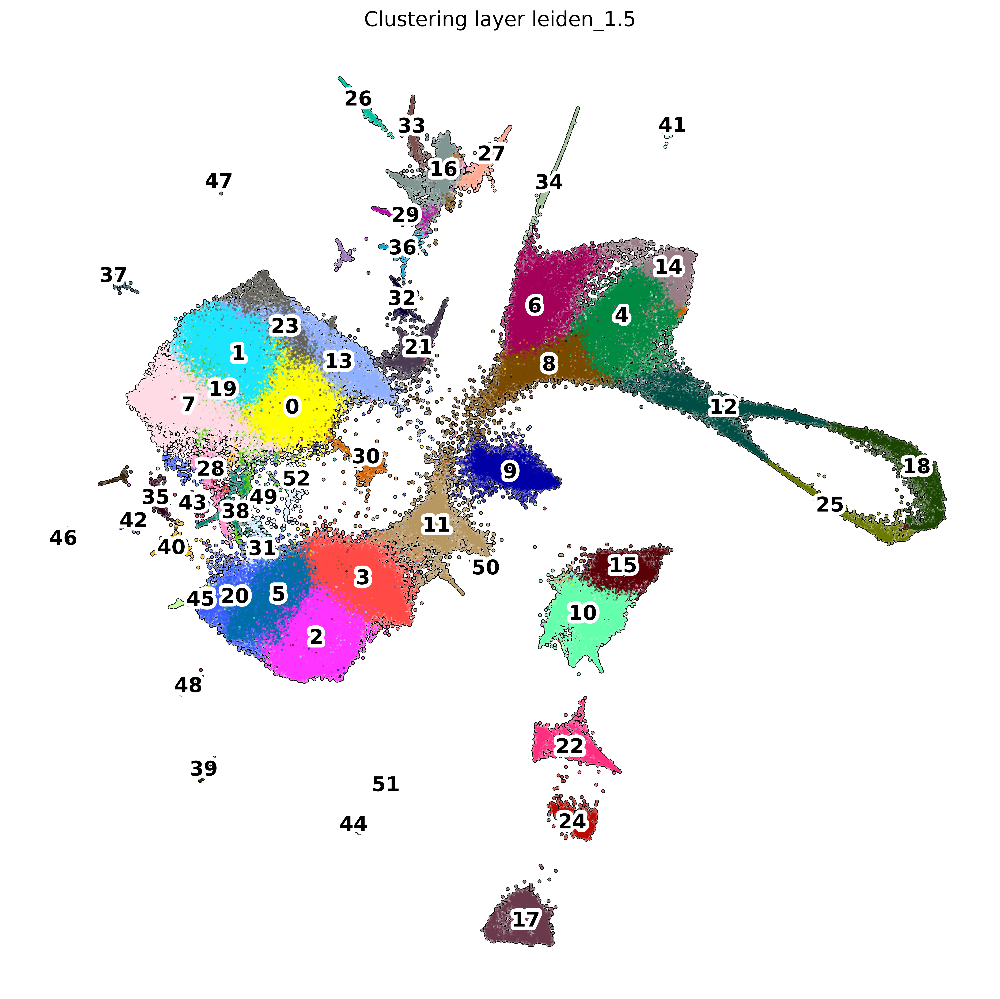

In [ ]:
with rc_context({'figure.figsize': (12, 12)}):
    sc.pl.umap(adata, color=clusteringlayer, legend_loc='on data', legend_fontoutline = 5, title= 'Clustering layer '+str(clusteringlayer), size = 10,
        frameon=False, add_outline = True)

In [ ]:
adata

AnnData object with n_obs × n_vars = 199113 × 18061
    obs: 'Experiment', 'Library', 'Body_part', 'Presence_of_PEG', 'batch', 'n_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_1', 'leiden_1.5', 'leiden_2', 'Colony_part', 'Unique'
    var: 'ratio_with_no', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Library_colors', 'dendrogram_leiden_1.5', 'hvg', 'leiden', 'leiden_1.5_colors', 'leiden_1_colors', 'leiden_2_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups_logreg_leiden_1', 'rank_genes_groups_logreg_leiden_1.5', 'rank_genes_groups_logreg_leiden_2', 'rank_genes_groups_wilcox_leiden_1', 'rank_genes_groups_wilcox_leiden_1.5', 'rank_genes_groups_wilcox_leiden_2', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
col_bp= {'Polyp_Feeding':'#759adc',
'Polyp_Mix':'#ff6247',
'Stolon':'#8d5dcd',
'Polyp_Sexual':'#df8920'}

In [ ]:
obs_cat = 'Colony_part'
for i in adata.obs[obs_cat].cat.categories:
    with rc_context({'figure.figsize': (12, 12)}):
        sc.pl.umap(adata, color= obs_cat, palette= col_bp,
                   groups = i,
                   legend_fontoutline = 5,
                   title= obs_cat + ': '+i, size = 10,
                   frameon=False, add_outline = True)

/mnt/sda/david/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


In [ ]:
adata.obs[obs_cat].cat.categories

In [ ]:
adata.obs['leiden_1.5'].value_counts()

## Transfering broad clusters and colours

In [ ]:
df = pd.read_excel('/mnt/sda/david/hydractinia/hsym_identities.xlsx', index_col = 'Cluster')

In [ ]:
df

In [ ]:
df.index = df.index.astype('string')

In [ ]:
df['order_cells'] = df.index.astype('int')

In [ ]:
df['order_sorted'] = list(range(0,53))

In [ ]:
df.columns

Index(['Broad Group', 'cell_numbers_specific', 'percentages_specific',
       'hex_specific', 'Abbrev', 'cell_number_broad', 'percentages_broad',
       'hex_broad', 'order_cells', 'order_sorted'],
      dtype='object')

In [ ]:
palette = df.sort_values(by = 'order_cells')['hex_specific'].to_list()

In [ ]:
palette

['#2196F3',
 '#1976D2',
 '#4DAA52',
 '#74BD78',
 '#CCCCCC',
 '#77D67B',
 '#999999',
 '#03A9F4',
 '#666666',
 '#BA55D3',
 '#FF4B6E',
 '#34F99B',
 '#FC6CBA',
 '#9933CC',
 '#E0E0E0',
 '#C83B57',
 '#FE720B',
 '#FFD700',
 '#FE96CF',
 '#00BCD4',
 '#85EC89',
 '#FFEB3B',
 '#FDD835',
 '#039BE5',
 '#FFEB99',
 '#FFB5DE',
 '#FFB681',
 '#FEA833',
 '#3F51B5',
 '#FFA443',
 '#1E88E5',
 '#A2F5A6',
 '#FFF176',
 '#FFBB43',
 '#333333',
 '#448AFF',
 '#800080',
 '#64B5F6',
 '#F5E9DC',
 '#F5E9DC',
 '#F5E9DC',
 '#F5E9DC',
 '#F5E9DC',
 '#F5E9DC',
 '#F5E9DC',
 '#F5E9DC',
 '#F5E9DC',
 '#F5E9DC',
 '#F5E9DC',
 '#F5E9DC',
 '#F5E9DC',
 '#F5E9DC',
 '#F5E9DC']

In [ ]:
adata

AnnData object with n_obs × n_vars = 199113 × 18061
    obs: 'Experiment', 'Library', 'Body_part', 'Presence_of_PEG', 'batch', 'n_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_1', 'leiden_1.5', 'leiden_2', 'Colony_part', 'Unique'
    var: 'ratio_with_no', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Library_colors', 'dendrogram_leiden_1.5', 'hvg', 'leiden', 'leiden_1.5_colors', 'leiden_1_colors', 'leiden_2_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups_logreg_leiden_1', 'rank_genes_groups_logreg_leiden_1.5', 'rank_genes_groups_logreg_leiden_2', 'rank_genes_groups_wilcox_leiden_1', 'rank_genes_groups_wilcox_leiden_1.5', 'rank_genes_groups_wilcox_leiden_2', 'umap', 'Colony_part_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
adata.uns['leiden_1.5_colors'] = np.array(palette)

In [ ]:
adata.uns['leiden_1.5_colors']

array(['#2196F3', '#1976D2', '#4DAA52', '#74BD78', '#CCCCCC', '#77D67B',
       '#999999', '#03A9F4', '#666666', '#BA55D3', '#FF4B6E', '#34F99B',
       '#FC6CBA', '#9933CC', '#E0E0E0', '#C83B57', '#FE720B', '#FFD700',
       '#FE96CF', '#00BCD4', '#85EC89', '#FFEB3B', '#FDD835', '#039BE5',
       '#FFEB99', '#FFB5DE', '#FFB681', '#FEA833', '#3F51B5', '#FFA443',
       '#1E88E5', '#A2F5A6', '#FFF176', '#FFBB43', '#333333', '#448AFF',
       '#800080', '#64B5F6', '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC',
       '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC',
       '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC'], dtype='<U7')

In [ ]:
sorted_palette = df['hex_specific'].to_list()

In [ ]:
adata.uns['leiden_1.5_colors_sorted'] = np.array(sorted_palette)

In [ ]:
adata.uns['leiden_1.5_colors_sorted']

array(['#CCCCCC', '#666666', '#E0E0E0', '#999999', '#333333', '#2196F3',
       '#1976D2', '#03A9F4', '#00BCD4', '#039BE5', '#3F51B5', '#1E88E5',
       '#448AFF', '#64B5F6', '#BA55D3', '#9933CC', '#800080', '#4DAA52',
       '#74BD78', '#77D67B', '#34F99B', '#85EC89', '#A2F5A6', '#FFEB3B',
       '#FFD700', '#FDD835', '#FFEB99', '#FFF176', '#FF4B6E', '#C83B57',
       '#FC6CBA', '#FE96CF', '#FFB5DE', '#FE720B', '#FFB681', '#FEA833',
       '#FFA443', '#FFBB43', '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC',
       '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC',
       '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC'], dtype='<U7')

In [ ]:
sorted_clusters = df.index.to_list()

In [ ]:
adata.uns['leiden_1.5_sorted'] = np.array(sorted_clusters)

In [ ]:
list(adata.uns)

['Library_colors',
 'dendrogram_leiden_1.5',
 'hvg',
 'leiden',
 'leiden_1.5_colors',
 'leiden_1_colors',
 'leiden_2_colors',
 'log1p',
 'neighbors',
 'pca',
 'rank_genes_groups_logreg_leiden_1',
 'rank_genes_groups_logreg_leiden_1.5',
 'rank_genes_groups_logreg_leiden_2',
 'rank_genes_groups_wilcox_leiden_1',
 'rank_genes_groups_wilcox_leiden_1.5',
 'rank_genes_groups_wilcox_leiden_2',
 'umap',
 'Colony_part_colors',
 'leiden_1.5_colors_sorted',
 'leiden_1.5_sorted']

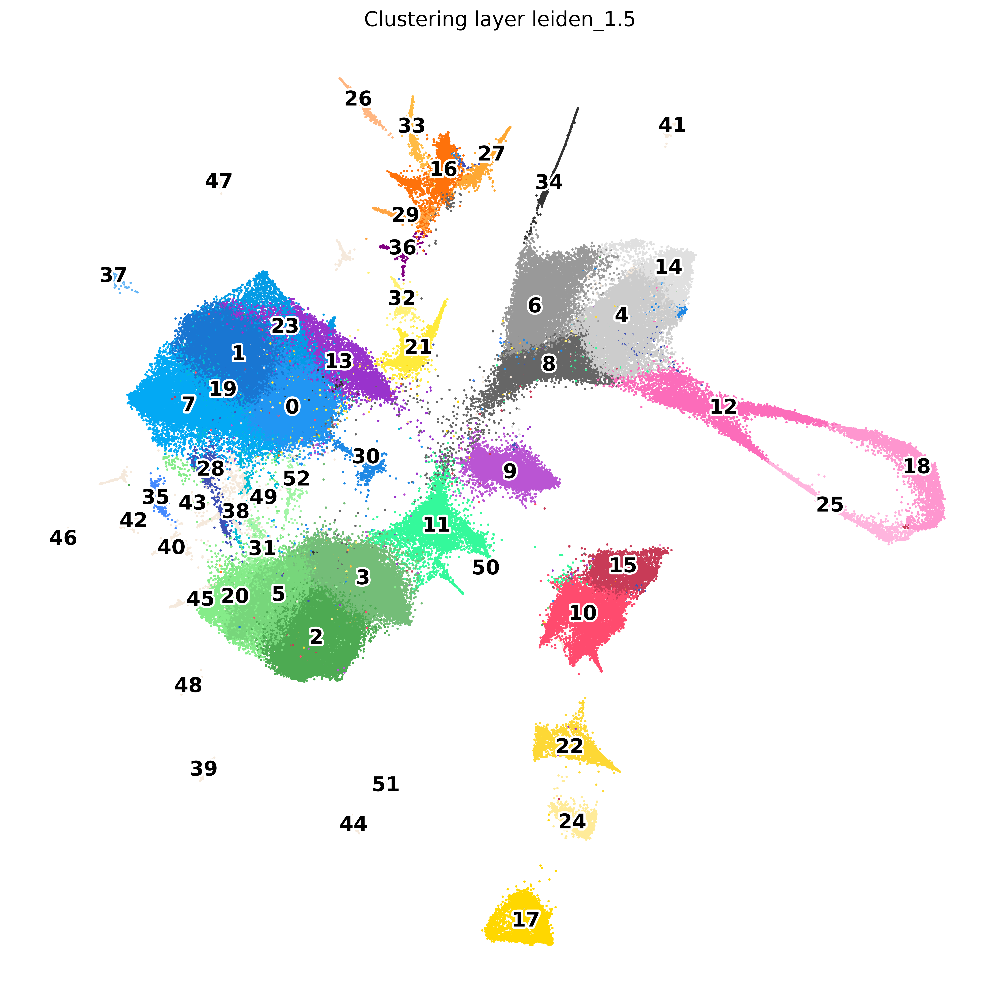

In [ ]:
with plt.rc_context({'figure.figsize': (12, 12)}):
    sc.pl.umap(adata, color=clusteringlayer, legend_loc= 'on data', legend_fontoutline = 3,
        title= 'Clustering layer '+str(clusteringlayer), size = 10,
        frameon=False, add_outline = False)

In [ ]:
adata.obs[clusteringlayer]

CTGTAGCCAAACATCGGACTAGTA-0-0     0
CGAACTTACAAGACTAACAGATTC-0-0     6
AGAGTCAACGACACACGATAGACA-0-0     4
CGCTGATCACGCTCGAAAGAGATC-0-0     8
AAGACGGAGGAGAACACGAACTTA-0-0     6
                                ..
CAATGGAAGAATCTGAATAGCGAC-3-1     0
AAGGTACACACCTTACCAGCGTTA-3-1    15
GAATCTGAACAAGCTATGAAGAGA-3-1    21
CTGGCATATGGCTTCACATACCAA-3-1    11
CTGGCATAAACTCACCCATACCAA-3-1    32
Name: leiden_1.5, Length: 199113, dtype: category
Categories (53, object): ['0', '1', '2', '3', ..., '49', '50', '51', '52']

In [ ]:
for i in adata.obs.index:
    adata.obs.loc[i, 'leiden_1.5_names'] = df['Abbrev'][adata.obs.loc[i, clusteringlayer]]
    adata.obs.loc[i, 'broad_names'] = df['Broad Group'][adata.obs.loc[i, clusteringlayer]]

In [ ]:
adata.obs

,Experiment,Library,Body_part,Presence_of_PEG,batch,n_counts,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden_1,leiden_1.5,leiden_2,Colony_part,Unique,leiden_1.5_names,broad_names
CTGTAGCCAAACATCGGACTAGTA-0-0,lib_29,lib_29_1,Polyps,PEG,3,52.0,50,50,52.0,0.0,0.0,0,0,13,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG,ep_1,epithelial
CGAACTTACAAGACTAACAGATTC-0-0,lib_29,lib_29_1,Polyps,PEG,3,109.0,99,99,109.0,0.0,0.0,3,6,3,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG,gmt_1,gametogenesis
AGAGTCAACGACACACGATAGACA-0-0,lib_29,lib_29_1,Polyps,PEG,3,124.0,107,107,124.0,0.0,0.0,2,4,4,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG,prog_early,progenitors
CGCTGATCACGCTCGAAAGAGATC-0-0,lib_29,lib_29_1,Polyps,PEG,3,83.0,62,62,83.0,0.0,0.0,3,8,21,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG,prog_mixed,progenitors
AAGACGGAGGAGAACACGAACTTA-0-0,lib_29,lib_29_1,Polyps,PEG,3,54.0,51,51,54.0,0.0,0.0,3,6,3,Polyp_Sexual,lib_29_1_Polyps_Polyp_Sexual_PEG,gmt_1,gametogenesis
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CAATGGAAGAATCTGAATAGCGAC-3-1,lib_20,lib_20_4,Polyps,PEG,1,74.0,70,70,74.0,0.0,0.0,0,0,0,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG,ep_1,epithelial
AAGGTACACACCTTACCAGCGTTA-3-1,lib_20,lib_20_4,Polyps,PEG,1,58.0,52,52,58.0,0.0,0.0,6,15,19,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG,nc_Tchh2+,nematocyte
GAATCTGAACAAGCTATGAAGAGA-3-1,lib_20,lib_20_4,Polyps,PEG,1,287.0,220,220,287.0,0.0,0.0,18,21,24,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG,gl_Rsp+,gland
CTGGCATATGGCTTCACATACCAA-3-1,lib_20,lib_20_4,Polyps,PEG,1,326.0,255,255,326.0,0.0,0.0,12,11,11,Polyp_Mix,lib_20_4_Polyps_Polyp_Mix_PEG,em_Shem+,epitheliomuscular


In [ ]:
df['hex_broad'].dropna()

Cluster
4     #E0E0E0
6     #5F575B
0     #2196F3
9     #BA55D3
2     #4DAA52
21    #FFF17E
10    #FF4B6E
12    #FC6CBA
16    #FE720B
38    #F5E9DC
Name: hex_broad, dtype: object

In [ ]:
df['hex_specific'].dropna()

Cluster
4     #CCCCCC
8     #666666
14    #E0E0E0
6     #999999
34    #333333
0     #2196F3
1     #1976D2
7     #03A9F4
19    #00BCD4
23    #039BE5
28    #3F51B5
30    #1E88E5
35    #448AFF
37    #64B5F6
9     #BA55D3
13    #9933CC
36    #800080
2     #4DAA52
3     #74BD78
5     #77D67B
11    #34F99B
20    #85EC89
31    #A2F5A6
21    #FFEB3B
17    #FFD700
22    #FDD835
24    #FFEB99
32    #FFF176
10    #FF4B6E
15    #C83B57
12    #FC6CBA
18    #FE96CF
25    #FFB5DE
16    #FE720B
26    #FFB681
27    #FEA833
29    #FFA443
33    #FFBB43
38    #F5E9DC
39    #F5E9DC
40    #F5E9DC
41    #F5E9DC
42    #F5E9DC
43    #F5E9DC
44    #F5E9DC
45    #F5E9DC
46    #F5E9DC
47    #F5E9DC
48    #F5E9DC
49    #F5E9DC
50    #F5E9DC
51    #F5E9DC
52    #F5E9DC
Name: hex_specific, dtype: object

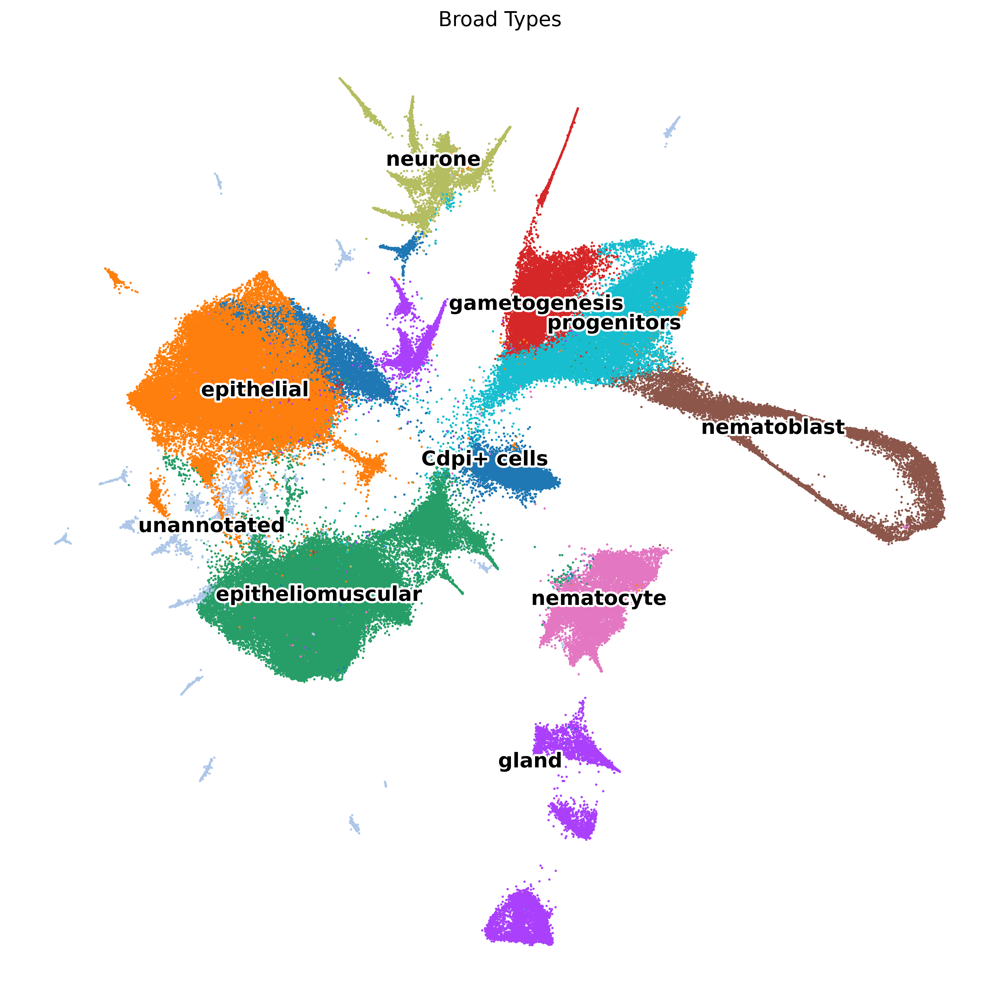

In [ ]:
with plt.rc_context({'figure.figsize': (12, 12)}):
    sc.pl.umap(adata, color='broad_names', legend_loc= 'on data', legend_fontoutline = 3,
        title= 'Broad Types', size = 10,
        frameon=False, add_outline = False)

In [ ]:
adata

AnnData object with n_obs × n_vars = 199113 × 18061
    obs: 'Experiment', 'Library', 'Body_part', 'Presence_of_PEG', 'batch', 'n_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_1', 'leiden_1.5', 'leiden_2', 'Colony_part', 'Unique', 'leiden_1.5_names', 'broad_names'
    var: 'ratio_with_no', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Library_colors', 'dendrogram_leiden_1.5', 'hvg', 'leiden', 'leiden_1.5_colors', 'leiden_1_colors', 'leiden_2_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups_logreg_leiden_1', 'rank_genes_groups_logreg_leiden_1.5', 'rank_genes_groups_logreg_leiden_2', 'rank_genes_groups_wilcox_leiden_1', 'rank_genes_groups_wilcox_leiden_1.5', 'rank_genes_groups_wilcox_leiden_2', 'umap', 'Colony_part_colors', 'leiden_1.5_colors_sorted', 'leiden_1.5_sorted', 'broad_names_colors'
    obsm: '

In [ ]:
adata.obs['broad_names'].cat.categories

Index(['Cdpi+ cells', 'epithelial', 'epitheliomuscular', 'gametogenesis',
       'gland', 'nematoblast', 'nematocyte', 'neurone', 'progenitors',
       'unannotated'],
      dtype='object')

In [ ]:
adata.uns['broad_names_colors'] = np.array(df[['Broad Group', 'hex_broad']].dropna().sort_values(by = 'Broad Group')['hex_broad'])

In [ ]:
adata.uns['broad_names_colors']

array(['#BA55D3', '#2196F3', '#4DAA52', '#5F575B', '#FFF17E', '#FC6CBA',
       '#FF4B6E', '#FE720B', '#E0E0E0', '#F5E9DC'], dtype=object)

In [ ]:
adata.uns['leiden_1.5_colors_sorted']

array(['#CCCCCC', '#666666', '#E0E0E0', '#999999', '#333333', '#2196F3',
       '#1976D2', '#03A9F4', '#00BCD4', '#039BE5', '#3F51B5', '#1E88E5',
       '#448AFF', '#64B5F6', '#BA55D3', '#9933CC', '#800080', '#4DAA52',
       '#74BD78', '#77D67B', '#34F99B', '#85EC89', '#A2F5A6', '#FFEB3B',
       '#FFD700', '#FDD835', '#FFEB99', '#FFF176', '#FF4B6E', '#C83B57',
       '#FC6CBA', '#FE96CF', '#FFB5DE', '#FE720B', '#FFB681', '#FEA833',
       '#FFA443', '#FFBB43', '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC',
       '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC',
       '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC', '#F5E9DC'], dtype='<U7')

In [ ]:
adata.obs['leiden_1.5_names'].cat.categories

Index(['Cdpi1+', 'Cdpi2+', 'Cdpi3+', 'em_1', 'em_2', 'em_3', 'em_4', 'em_5',
       'em_Shem+', 'ep_1', 'ep_2', 'ep_3', 'ep_4', 'ep_5', 'ep_6', 'ep_7',
       'ep_8', 'ep_9', 'gl_4', 'gl_Chitinase2+', 'gl_Nas4+', 'gl_Nas14+',
       'gl_Rsp+', 'gmt_1', 'gmt_2', 'nb_1', 'nb_3', 'nb_Hrnr+', 'nc_Tchh1+',
       'nc_Tchh2+', 'ne_4', 'ne_Fax+', 'ne_Inv+', 'ne_Pkdrej+', 'ne_Rf/Glw+',
       'prog_early', 'prog_i-cell', 'prog_mixed'],
      dtype='object')

In [ ]:
adata

AnnData object with n_obs × n_vars = 199113 × 18061
    obs: 'Experiment', 'Library', 'Body_part', 'Presence_of_PEG', 'batch', 'n_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_1', 'leiden_1.5', 'leiden_2', 'Colony_part', 'Unique', 'leiden_1.5_names', 'broad_names'
    var: 'ratio_with_no', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Library_colors', 'dendrogram_leiden_1.5', 'hvg', 'leiden', 'leiden_1.5_colors', 'leiden_1_colors', 'leiden_2_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups_logreg_leiden_1', 'rank_genes_groups_logreg_leiden_1.5', 'rank_genes_groups_logreg_leiden_2', 'rank_genes_groups_wilcox_leiden_1', 'rank_genes_groups_wilcox_leiden_1.5', 'rank_genes_groups_wilcox_leiden_2', 'umap', 'Colony_part_colors', 'leiden_1.5_colors_sorted', 'leiden_1.5_sorted', 'broad_names_colors'
    obsm: '

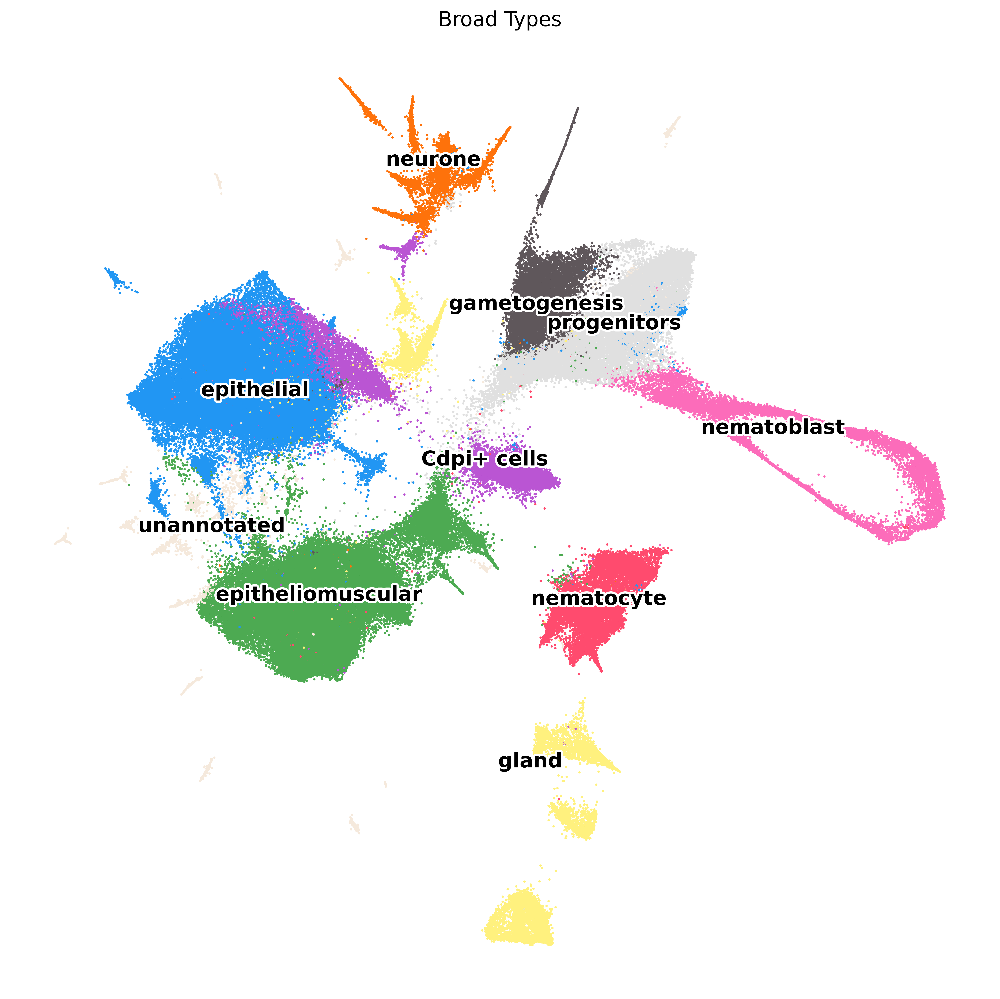

In [ ]:
with plt.rc_context({'figure.figsize': (12, 12)}):
    sc.pl.umap(adata, color='broad_names', legend_loc= 'on data', legend_fontoutline = 3,
        title= 'Broad Types', size = 10,
        frameon=False, add_outline = False)

In [ ]:
adata

AnnData object with n_obs × n_vars = 199113 × 18061
    obs: 'Experiment', 'Library', 'Body_part', 'Presence_of_PEG', 'batch', 'n_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_1', 'leiden_1.5', 'leiden_2', 'Colony_part', 'Unique', 'leiden_1.5_names', 'broad_names'
    var: 'ratio_with_no', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Library_colors', 'dendrogram_leiden_1.5', 'hvg', 'leiden', 'leiden_1.5_colors', 'leiden_1_colors', 'leiden_2_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups_logreg_leiden_1', 'rank_genes_groups_logreg_leiden_1.5', 'rank_genes_groups_logreg_leiden_2', 'rank_genes_groups_wilcox_leiden_1', 'rank_genes_groups_wilcox_leiden_1.5', 'rank_genes_groups_wilcox_leiden_2', 'umap', 'Colony_part_colors', 'leiden_1.5_colors_sorted', 'leiden_1.5_sorted', 'broad_names_colors'
    obsm: '

## Joining the coloured data in a final h5mu file

In [ ]:
mdata = md.MuData({'with':(mdata.mod['with']), 'no':adata})

/mnt/sda/david/.local/lib/python3.8/site-packages/mudata/_core/mudata.py:457: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


In [ ]:
mdata

MuData object with n_obs × n_vars = 277529 × 41187
  2 modalities
    with:	277529 x 23126
      obs:	'Experiment', 'Library', 'Body_part', 'Presence_of_PEG', 'batch', 'Colony_part', 'Unique'
      var:	'ratio_with_no'
    no:	199113 x 18061
      obs:	'Experiment', 'Library', 'Body_part', 'Presence_of_PEG', 'batch', 'n_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_1', 'leiden_1.5', 'leiden_2', 'Colony_part', 'Unique', 'leiden_1.5_names', 'broad_names'
      var:	'ratio_with_no', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
      uns:	'Library_colors', 'dendrogram_leiden_1.5', 'hvg', 'leiden', 'leiden_1.5_colors', 'leiden_1_colors', 'leiden_2_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups_logreg_leiden_1', 'rank_genes_groups_logreg_leiden_1.5', 'rank_genes_groups_logreg_leiden_2', 'rank_genes_groups_wilcox_leiden_1', 'rank_genes_groups_wilcox_leiden_1.5', 'rank_genes_groups_wilcox_leiden_2', 'umap', 'Colony_part_colors', 'leiden_1.5_colors_sorted', 'leiden_1.5_sorted', 'broad_names_colors'
      obsm:	'X_pca', 'X_pca_harmony', 'X_umap'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'

In [ ]:
mdata.write("/mnt/sda/david/hydractinia/hydractinia_atlas_colored_20230825.h5mu")

/mnt/sda/david/.local/lib/python3.8/site-packages/mudata/_core/mudata.py:457: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(
